# **Семинар 7**. Single Shot Detector

In [ ]:
import matplotlib.pyplot   as plt
import torch.nn.functional as F
import torchvision
import colorsys
import random
import torch
import cv2

from matplotlib         import patches, lines
from matplotlib.patches import Polygon
from torchvision        import transforms
from torch              import nn
from PIL                import Image

import numpy as np
import scipy as sp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import warnings
warnings.filterwarnings('ignore')

In [ ]:
model = torchvision.models.detection.ssd300_vgg16(pretrained=True)
model.eval()

transform = transforms.Compose([transforms.ToTensor()])

img_path  = "../input/temporary/1.jpeg"
img_pil   = Image.open(img_path) 
img_torch = transform(img_pil)

predictions = model( [img_torch] )

In [ ]:
predictions[0].keys()

In [ ]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = transforms.ToPILImage()(img.to('cpu'))
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])


In [ ]:
img_pil

In [ ]:
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils import draw_bounding_boxes

colors = ["blue"]*200
result = draw_bounding_boxes(convert_image_dtype(img_torch, dtype=torch.uint8), predictions[0]['boxes'], colors=colors, width=1)
show(result)

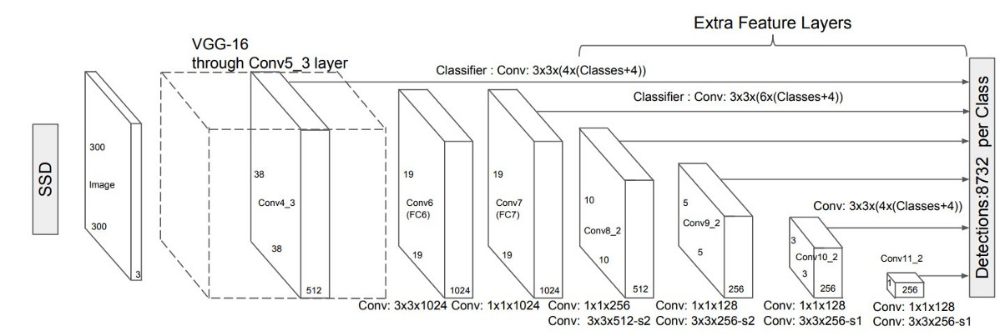

`SSD (Single Shot Detector)` - один из самых популярных детекторов nowadays, вместе с `Mask-RCNN` и `YOLOv3`. Многие исследователи также продолжают использовать `Faster-RCNN` (с тяжелым `backbone` он точнее, но скорость `1 frame/sec`). 

Когда что-то изучаете, хорошо обращаться к истокам - то есть к [оригинальной статье](https://arxiv.org/pdf/1512.02325.pdf) 2016 года (всего через несколько месяцев после `Faster R-CNN` и `YOLO` появился). При этом по сравнению с таким же `one-stage` `YOLOv1`, `SSD` значительно точнее и такой же быстрый. В статье представлены две версии модели - `SSD300`, `SSD512`, которые суть одно и то же, но отличаются размером входа и некоторыми параметрами (конечно, `SSD512` массивнее и точнее), мы же сегодня рассмотрим `SSD300`. 

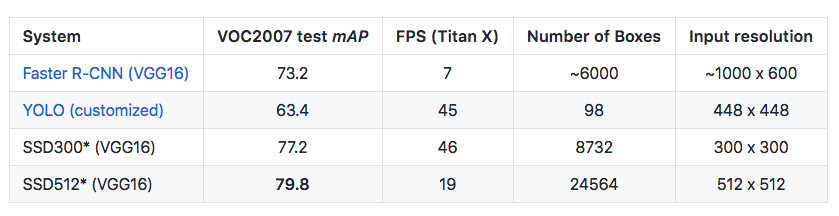

На [`papers with code`](https://paperswithcode.com/method/ssd) можно посмотреть насколько `SSD` популярен и используем, а на [`github`](https://github.com/amdegroot/ssd.pytorch) есть довольно хорошая (но не самая простая) `pytorch` реализация. Одну из визуализаций работы можно смотреть [тут](https://www.youtube.com/watch?v=7p2XL8wApfo&t=2s).

В [`torchvision 0.10`](https://pytorch.org/vision/stable/models.html#object-detection-instance-segmentation-and-person-keypoint-detection) появились две версии `SSD`: [`SSD300 VGG16`](https://pytorch.org/vision/stable/models.html#id37) (это классика) и [`SSDlite320 MobileNetV3-Large`](https://pytorch.org/vision/stable/models.html#id38).

**Основные концепции, которые надо помнить и понимать, чтобы работать с SSD**:
 - `feature maps `
 - `IoU (Jaccard Index)`
 - Якоря (`anchors`, они же в терминологии `SSD` - `priors`)
 - `Hard Negative Mining` (обсудим)
 - `NMS` (`non-maximum suppression`)
 - `Average Precision` (`AP`)
 - `MultiBox Loss` (`localization + classification`)


## **7.1 Архитектура SSD (vgg + convs + anchors)**

Для простоты слои в SSD можно разделить на 3 группы: `backbone` (`базовые сверточные слои`), `auxiliary convolutions` (`вспомогательные свертки`) и `prediction convolutions` (`предсказательные свертки`).

- **`Backbone`** - основа получаемого признакового представления, обычно предобученная на `ImageNet` модель. У `SSD` изначально `VGG16`, но менять её можно (и нужно) в зависимости от ваших желаний
- **`Auxiliary`** часть - навешанные после `backbone` конволюции для получения новых, более глубоких `feature maps`
- **`Prediction`** часть - конволюции, на основе которых мы получаем предсказания по локализации и классификации объектов
- **`Якоря` (`Anchors`)** в явном виде НЕ ВКЛЮЧЕНЫ в архитектуру, только их количество, но в обучении они играют важнейшую роль.

### **7.1.1. Backbone - VGG16**



Вспомним как выглядит классическая `VGG16` архитектура:

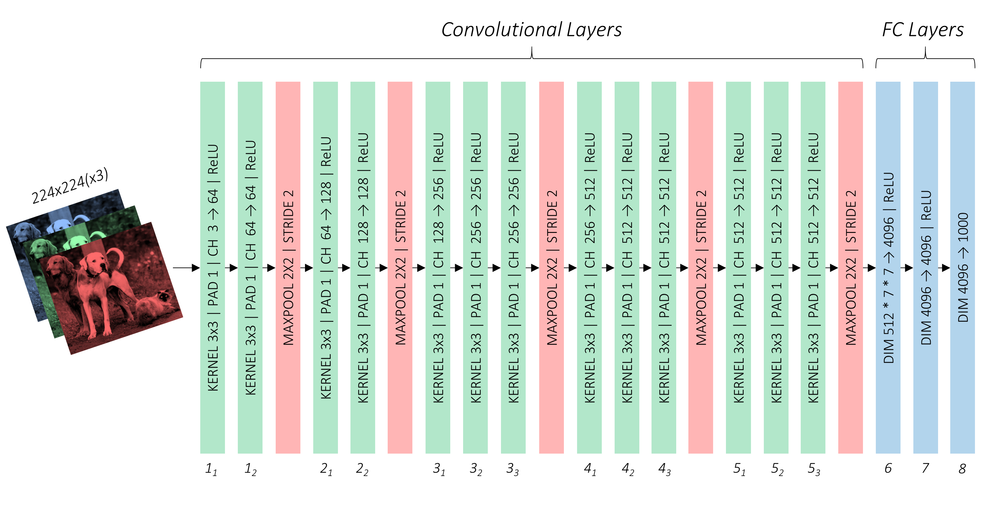

В `SSD` в архитектуру `VGG16` внесены некоторые **изменения**:
 - `input` теперь `(300, 300, 3)`
 - `MaxPool_3` при вычислении размера `output` использует `ceiling` функцию вместо дефолтной ([`ceil_mode=True`](https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html)). Это сделано просто чтобы размер `output` стал `(38, 38)` вместо `(37, 37)`
 - `MaxPool_5: kernel=(2, 2), stride=2 -> kernel(3, 3), stride=1`. То есть теперь не урезает размерность в 2 раза
 - `FC` слои нам не нужны, `FC8` просто выкинули, а `FC6`, `FC7` заменили на эквивалентные конволюции `conv6`, `conv7`.


Разберемся с последним:

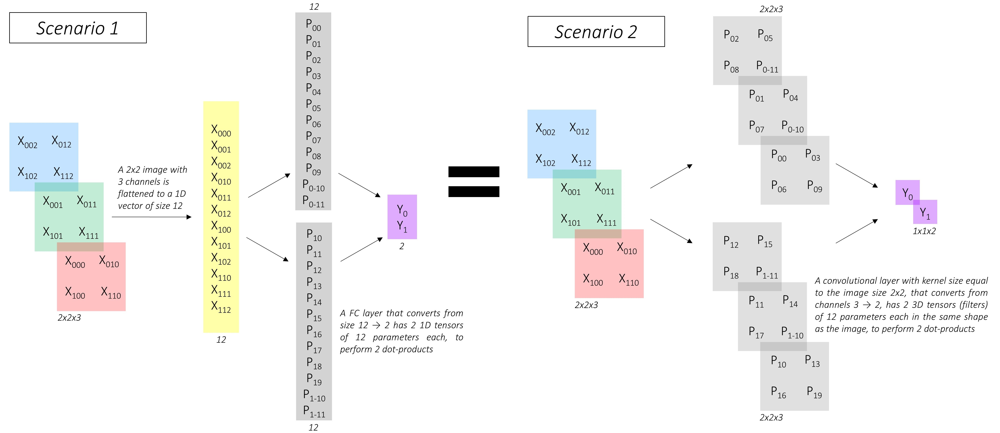

То есть для изображения размера `(H, W)` с `I` каналами применение `FC` слоя с `N` выходами это **то же самое** что применение `Conv` слоя c ядром `(H, W)` и `N` выходами (то есть `N` свертками толщины `I`).

Число параметров осталось таким же, а значит когда мы захотели бы взять веса с `ImageNet` надо было бы сделать просто правильный `reshape`. 

Однако просто заменой дело не кончилось. В первоначальной сетке на вход шел тензор размера `(224, 224, 3)` и выход `conv5_3` должен быть размера  `(7, 7, 512)`
 - на `FC6` были размерности `7 * 7 * 512 -> 4096`, а значит у новой `conv6` `kernel (7, 7)`, толщина свертки `512` и таких обучаемых ядер `4096` `(4096, 7, 7, 512)` 
 - на `FC7` `4096 -> 4096`, а значит `conv7` это `4096` ядер `(1, 1)` с толщиной `4096` `(4096, 1, 1, 4096)`


Это **очень много параметров**, что вычислительно тяжело.   

Поэтому сделали следующие замены:
 - `conv6`:  `(4096, 7, 7, 512) -> (1024, 3, 3, 512)`
 - `conv7`: `(4096, 1, 1, 4096) -> (1024, 1, 1, 1024)`

Сделано это было с помощью `downsampling` (или [`decimation`](https://ru.wikipedia.org/wiki/%D0%94%D0%B5%D1%86%D0%B8%D0%BC%D0%B0%D1%86%D0%B8%D1%8F_(%D0%BE%D0%B1%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%BA%D0%B0_%D1%81%D0%B8%D0%B3%D0%BD%D0%B0%D0%BB%D0%BE%D0%B2))) - то есть при подгрузке весов брали каждое m-ое число. При изменении ядер `(7, 7) -> (3, 3)` можно взять `m=3` и получить тот же `receptive field`, просто с дырками в ядре. Но так как на предыдущем слое размерность больше не падает, авторы взяли `m=6`. 

После всех изменений мы получаем такой `backbone`:



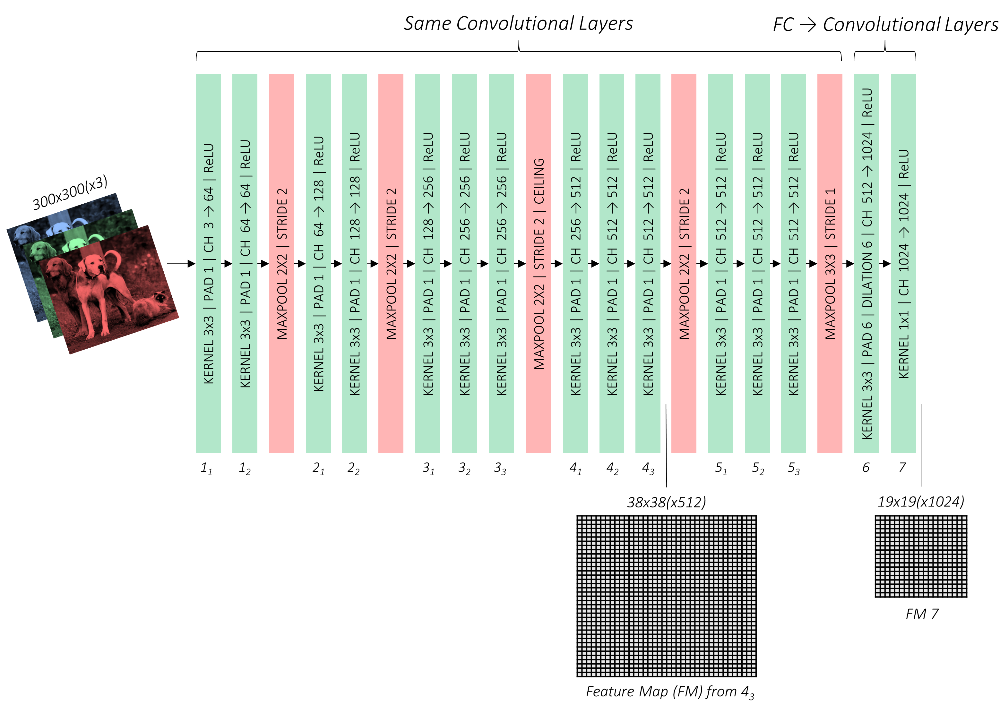

Обратите внимание на выходы слоев **`conv4_3`** и **`conv_7`** - именно они являются `output`-ами нашего бэкбона. Это первые две "головы" нашего детектора, то есть первые две `feature maps`, на которых мы будем искать объекты. 

Теперь давайте посмотрим на код всего этого:

In [ ]:
import torch
import torchvision
import torch.nn.functional as F

from PIL import Image
from torchvision import transforms
from torch import nn
from math import sqrt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import warnings
warnings.filterwarnings('ignore')

In [ ]:
## VGG Backbone. Архитектура, forward, подгрузка весов

class VGGBase(nn.Module):
    def __init__(self):
        super(VGGBase, self).__init__()

        # Standard convolutional layers in VGG16
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True)  # ceiling (not floor) метод для четности

        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)  #изменили ядра, а значит размер теперь не падает

        # переписываем FC в конволюции (помним про downsampling)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, padding=6, dilation=6)  
        self.conv7 = nn.Conv2d(1024, 1024, kernel_size=1)

        # подгружаем веса
        self.load_pretrained_layers()

    def forward(self, image):
        # input (N, 3, 300, 300)
        out = F.relu(self.conv1_1(image))  # (N, 64, 300, 300)
        out = F.relu(self.conv1_2(out))  # (N, 64, 300, 300)
        out = self.pool1(out)  # (N, 64, 150, 150)

        out = F.relu(self.conv2_1(out))  # (N, 128, 150, 150)
        out = F.relu(self.conv2_2(out))  # (N, 128, 150, 150)
        out = self.pool2(out)  # (N, 128, 75, 75)

        out = F.relu(self.conv3_1(out))  # (N, 256, 75, 75)
        out = F.relu(self.conv3_2(out))  # (N, 256, 75, 75)
        out = F.relu(self.conv3_3(out))  # (N, 256, 75, 75)
        out = self.pool3(out)  # (N, 256, 38, 38)

        out = F.relu(self.conv4_1(out))  # (N, 512, 38, 38)
        out = F.relu(self.conv4_2(out))  # (N, 512, 38, 38)
        out = F.relu(self.conv4_3(out))  # (N, 512, 38, 38)
        conv4_3_feats = out  # ПЕРВАЯ ГОЛОВА

        out = self.pool4(out)  # (N, 512, 19, 19)
        out = F.relu(self.conv5_1(out))  # (N, 512, 19, 19)
        out = F.relu(self.conv5_2(out))  # (N, 512, 19, 19)
        out = F.relu(self.conv5_3(out))  # (N, 512, 19, 19)
        out = self.pool5(out)            # (N, 1024, 19, 19)
        out = F.relu(self.conv6(out))    # (N, 1024, 19, 19)
        conv7_feats = F.relu(self.conv7(out))  # ВТОРАЯ ГОЛОВА

        return conv4_3_feats, conv7_feats

    #берем ImageNet веса и делаем необходимые решейпы для измененных слоев
    def load_pretrained_layers(self):
        
        #state dict нашей архитектуры
        state_dict = self.state_dict()
        param_names = list(state_dict.keys())

        #предобученный state dict
        pretrained_state_dict = torchvision.models.vgg16(pretrained=True).state_dict()
        pretrained_param_names = list(pretrained_state_dict.keys())

        #выкидываем из него последние веса, осносящиеся к FC6, FC7
        for i, param in enumerate(param_names[:-4]): 
            state_dict[param] = pretrained_state_dict[pretrained_param_names[i]] #записали неизменные в наш state_dict

        #FC6
        conv_fc6_weight = pretrained_state_dict['classifier.0.weight'].view(4096, 512, 7, 7)
        conv_fc6_bias = pretrained_state_dict['classifier.0.bias']
        
        #(4096, 512, 7, 7) -> (1024, 512, 3, 3)
        state_dict['conv6.weight'] = decimate(conv_fc6_weight, m=[4, None, 3, 3]) 
        state_dict['conv6.bias'] = decimate(conv_fc6_bias, m=[4])
        
        # FC7
        conv_fc7_weight = pretrained_state_dict['classifier.3.weight'].view(4096, 4096, 1, 1)
        conv_fc7_bias = pretrained_state_dict['classifier.3.bias'] 
        
        # (4096, 4096, 1, 1) -> (1024, 1024, 1, 1)
        state_dict['conv7.weight'] = decimate(conv_fc7_weight, m=[4, 4, None, None]) 
        state_dict['conv7.bias'] = decimate(conv_fc7_bias, m=[4]) # (1024)

        #подгружаем готовые веса
        self.load_state_dict(state_dict)

        print("\n Loaded backbone.\n")

#делаем DownSample - берем каждое m-ое значение
#m - массив отступов по соответствующему dimention
def decimate(tensor, m):
    assert tensor.dim() == len(m)
    for d in range(tensor.dim()):
        if m[d] is not None:
            tensor = tensor.index_select(dim=d, index=torch.arange(start=0, end=tensor.size(d), step=m[d]).long())
    return tensor

### **7.1.2 Дополнительные конволюции (Auxiliary and Prediction)**

Это самая простая часть :) 

Просто добавляем больше конволюций после `VGG16` и вытаскиваем оттуда ещё `4` карты (головы):

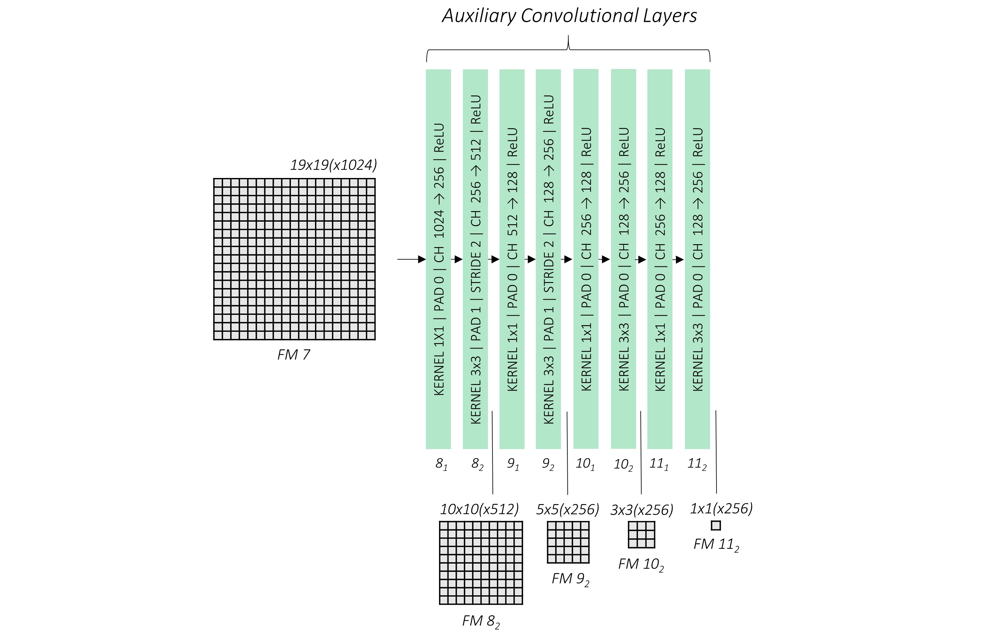

Таким образом у нас получилось **6 feature maps**, на основании которых мы будем получать наши детекции. 

Как? На каждую голову навешивается ещё по 2 конволюции (`prediction convolutions`) - одна получает представления для локализации, другая - для классификации. 

Выглядит это так:


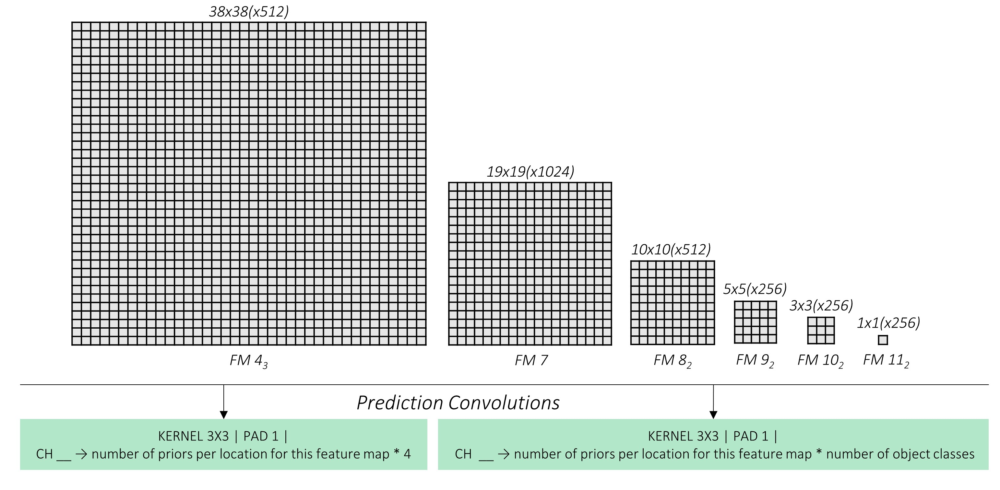

А сколько таких представлений выдают `prediction` слои? Зависит от якорей!

Для предсказаний мы используем `conv(3, 3)` с `pad=1`, а значит размерность не снижается. Вот такие карты мы получаем на выходе: 

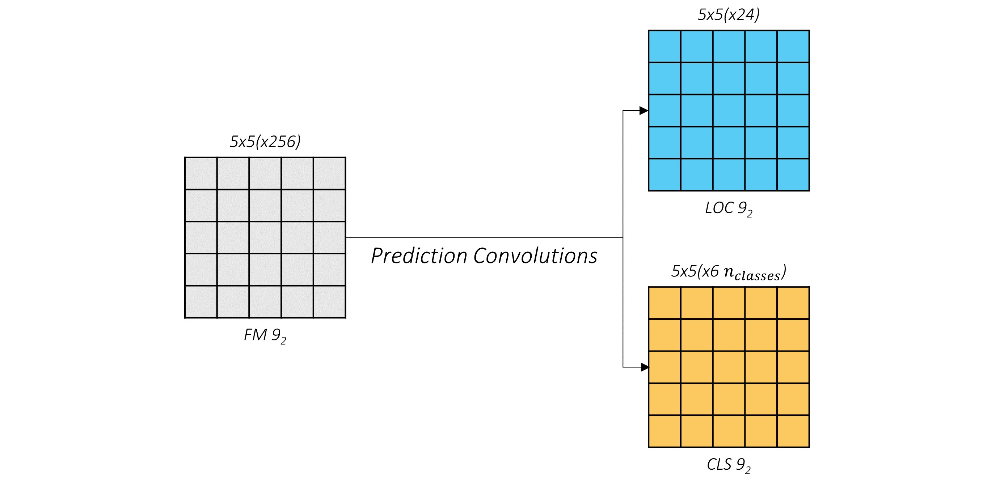

Почему в одном случае глубина таких карт `4*6`, а в другом `n_class*6`?

Потому что для `FM_9_2` в каждой точке мы имеем `6` якорей. Для локализации каждого нужно `4` значения, а на классификации получаем для каждого якоря вероятности каждого из классов. 

Примем, что на каждой `feature map` у нас в каждой точке есть фиксированное число якорей (не думаем пока каких) и посмотрим на код для этих частей:

In [ ]:
#конволюции вне VGG для 4 более высокоуровневых feature map
class AuxiliaryConvolutions(nn.Module):
    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0) 
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)

        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)

        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)

        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)

    def forward(self, conv7_feats):
        out = F.relu(self.conv8_1(conv7_feats))  # (N, 256, 19, 19)
        out = F.relu(self.conv8_2(out))  # (N, 512, 10, 10)
        conv8_2_feats = out 

        out = F.relu(self.conv9_1(out))  # (N, 128, 10, 10)
        out = F.relu(self.conv9_2(out))  # (N, 256, 5, 5)
        conv9_2_feats = out 

        out = F.relu(self.conv10_1(out))  # (N, 128, 5, 5)
        out = F.relu(self.conv10_2(out))  # (N, 256, 3, 3)
        conv10_2_feats = out  

        out = F.relu(self.conv11_1(out))  # (N, 128, 3, 3)
        out = F.relu(self.conv11_2(out))  # (N, 256, 1, 1)
        conv11_2_feats = out

        # на выходе также части нашей feature pyramid 
        return conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats


#конволюции для предсказаний  - работают для КАЖДОГО ЯКОРЯ 
class PredictionConvolutions(nn.Module):
    def __init__(self, n_classes):
        super(PredictionConvolutions, self).__init__()
        self.n_classes = n_classes

        #число боксов на каждой feature map
        n_boxes = {'conv4_3': 4, 'conv7': 6, 'conv8_2': 6,
                   'conv9_2': 6, 'conv10_2': 4, 'conv11_2': 4}

        # конволюции для локализации - на каждую голову, число выходов - число якорей * 4, тк координаты
        self.loc_conv4_3 = nn.Conv2d(512, n_boxes['conv4_3'] * 4, kernel_size=3, padding=1)
        self.loc_conv7 = nn.Conv2d(1024, n_boxes['conv7'] * 4, kernel_size=3, padding=1)
        self.loc_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2'] * 4, kernel_size=3, padding=1)

        # конволюция для классификации - на каждую голову, число выходов - число якорей * n_classes (bgr уже в классах)
        self.cl_conv4_3 = nn.Conv2d(512, n_boxes['conv4_3'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv7 = nn.Conv2d(1024, n_boxes['conv7'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2'] * n_classes, kernel_size=3, padding=1)

    def forward(self, conv4_3_feats, conv7_feats, conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats):
        batch_size = conv4_3_feats.size(0)

        # локализация (отступы) и view в понимаемый вид
        l_conv4_3 = self.loc_conv4_3(conv4_3_feats)  # (N, 16, 38, 38)
        l_conv4_3 = l_conv4_3.permute(0, 2, 3, 1).contiguous()  # (N, 38, 38, 16)
        l_conv4_3 = l_conv4_3.view(batch_size, -1, 4)  # (N, 5776, 4)

        l_conv7 = self.loc_conv7(conv7_feats)  # (N, 24, 19, 19)
        l_conv7 = l_conv7.permute(0, 2, 3, 1).contiguous()  # (N, 19, 19, 24)
        l_conv7 = l_conv7.view(batch_size, -1, 4)  # (N, 2166, 4)

        l_conv8_2 = self.loc_conv8_2(conv8_2_feats)  # (N, 24, 10, 10)
        l_conv8_2 = l_conv8_2.permute(0, 2, 3, 1).contiguous()  # (N, 10, 10, 24)
        l_conv8_2 = l_conv8_2.view(batch_size, -1, 4)  # (N, 600, 4)

        l_conv9_2 = self.loc_conv9_2(conv9_2_feats)  # (N, 24, 5, 5)
        l_conv9_2 = l_conv9_2.permute(0, 2, 3, 1).contiguous()  # (N, 5, 5, 24)
        l_conv9_2 = l_conv9_2.view(batch_size, -1, 4)  # (N, 150, 4)

        l_conv10_2 = self.loc_conv10_2(conv10_2_feats)  # (N, 16, 3, 3)
        l_conv10_2 = l_conv10_2.permute(0, 2, 3, 1).contiguous()  # (N, 3, 3, 16)
        l_conv10_2 = l_conv10_2.view(batch_size, -1, 4)  # (N, 36, 4)

        l_conv11_2 = self.loc_conv11_2(conv11_2_feats)  # (N, 16, 1, 1)
        l_conv11_2 = l_conv11_2.permute(0, 2, 3, 1).contiguous()  # (N, 1, 1, 16)
        l_conv11_2 = l_conv11_2.view(batch_size, -1, 4)  # (N, 4, 4)

        #предсказание классов и view в понимаемый вид
        c_conv4_3 = self.cl_conv4_3(conv4_3_feats)  # (N, 4 * n_classes, 38, 38)
        c_conv4_3 = c_conv4_3.permute(0, 2, 3, 1).contiguous()  # (N, 38, 38, 4 * n_classes)
        c_conv4_3 = c_conv4_3.view(batch_size, -1, self.n_classes)  # (N, 5776, n_classes)

        c_conv7 = self.cl_conv7(conv7_feats)  # (N, 6 * n_classes, 19, 19)
        c_conv7 = c_conv7.permute(0, 2, 3, 1).contiguous()  # (N, 19, 19, 6 * n_classes)
        c_conv7 = c_conv7.view(batch_size, -1,self.n_classes)  # (N, 2166, n_classes)

        c_conv8_2 = self.cl_conv8_2(conv8_2_feats)  # (N, 6 * n_classes, 10, 10)
        c_conv8_2 = c_conv8_2.permute(0, 2, 3, 1).contiguous()  # (N, 10, 10, 6 * n_classes)
        c_conv8_2 = c_conv8_2.view(batch_size, -1, self.n_classes)  # (N, 600, n_classes)

        c_conv9_2 = self.cl_conv9_2(conv9_2_feats)  # (N, 6 * n_classes, 5, 5)
        c_conv9_2 = c_conv9_2.permute(0, 2, 3, 1).contiguous()  # (N, 5, 5, 6 * n_classes)
        c_conv9_2 = c_conv9_2.view(batch_size, -1, self.n_classes)  # (N, 150, n_classes)

        c_conv10_2 = self.cl_conv10_2(conv10_2_feats)  # (N, 4 * n_classes, 3, 3)
        c_conv10_2 = c_conv10_2.permute(0, 2, 3, 1).contiguous()  # (N, 3, 3, 4 * n_classes)
        c_conv10_2 = c_conv10_2.view(batch_size, -1, self.n_classes)  # (N, 36, n_classes)

        c_conv11_2 = self.cl_conv11_2(conv11_2_feats)  # (N, 4 * n_classes, 1, 1)
        c_conv11_2 = c_conv11_2.permute(0, 2, 3, 1).contiguous()  # (N, 1, 1, 4 * n_classes)
        c_conv11_2 = c_conv11_2.view(batch_size, -1, self.n_classes)  # (N, 4, n_classes)

        #теперь всё собираем в нужном порядке (соответственно якорям)
        locs = torch.cat([l_conv4_3, l_conv7, l_conv8_2, l_conv9_2, l_conv10_2, l_conv11_2], dim=1)  # (N, 8732, 4)
        classes_scores = torch.cat([c_conv4_3, c_conv7, c_conv8_2, c_conv9_2, c_conv10_2, c_conv11_2], dim=1)  # (N, 8732, n_classes)

        return locs, classes_scores

### **7.1.3 Якоря (anchors/prior box)**

*Самое сладенькое.*

В `Faster R-CNN` мы уже видели подобную конструкцию - это некоторые инициализации для будущих детекций. 

**Какие у них особенности в SSD?**
- якоря применяются на всех `6` головах `SSD`
- у якоря есть `s - scale`, это значит что площадь якоря будет `s^2*S_fm`. Например, на самой первой и большой `fm - conv4_3` у всех якорей `scale` `0.1` (то есть `10%` от размеров `fm`), самый большой `scale` на последнем слое `conv11_2` - `0.9`, но там размерность `feature map` уже `(1, 1)`, а значит `receptive field` такого представления - ВСЯ первоначальная картинка. Отсюда прямо следует что **чем выше номер головы**, тем **более крупные объекты** там детектируются. 
- в каждой точке `feature map` мы будем иметь несколько якорей одинакового `scale` (кроме одного), но с разным `aspect ratio` - будем работать с квадратами `1:1`, горизонтальными прямоугольниками - `1:2`, `1:3` и вертикальными прямоугольниками - `2:1`, `3:1`. 

**Важный note**: якоря желательно четко подбирать под вашу задачу. Если вы будете детектировать гуляющих людей, вам не понадобятся горизонтальные длинные якори. Удалив их, получите детектор, который быстрее выучится и будет точнее локализовать объекты.

В целом статистика по якорям выглядит так:

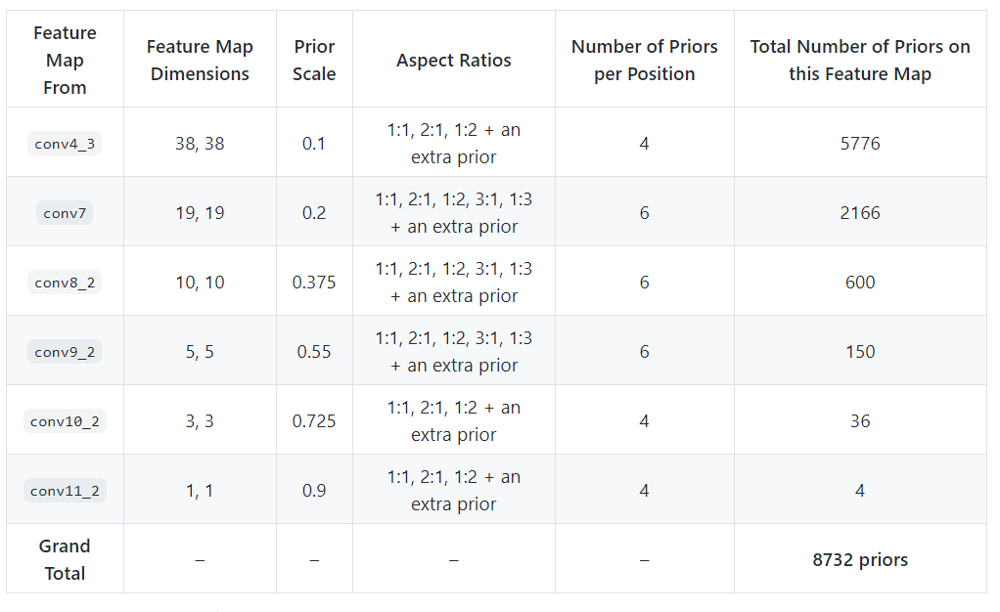

Итак, якоря определяются своими параметрами `scale` и `aspect ratio`, инициализируются с центром в каждой точке `feature map` и обрезаются, если вылезают за края изображения. Для того же слоя `conv9_2` они выглядят так:

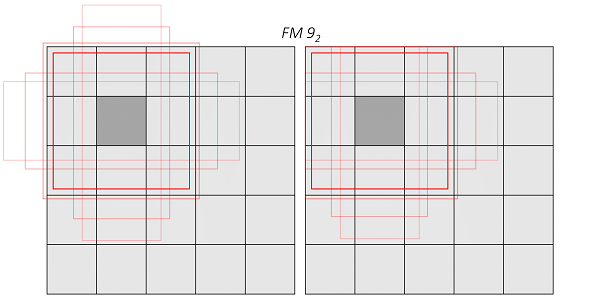

Якоря явно не входят в слои детектора, и на `prediction` слое ядра не ходят по заранее очерченным границам, которые якори задают (как можно было бы сделать например). От якорей по сути нужны только их координаты, которые будут уточняться в `localization prediction`. В создании представлений якори не участвуют, мы только **закрепили** что определенное представление (`N`-ое) соответствует определенному якорю. И в процессе обучения оно **само выучитывается** тому, чтобы наилучшим образом соответствовать объекту в области якоря. 

Поканально в `prediction convolution` результатах соответствие якорям выглядит так:


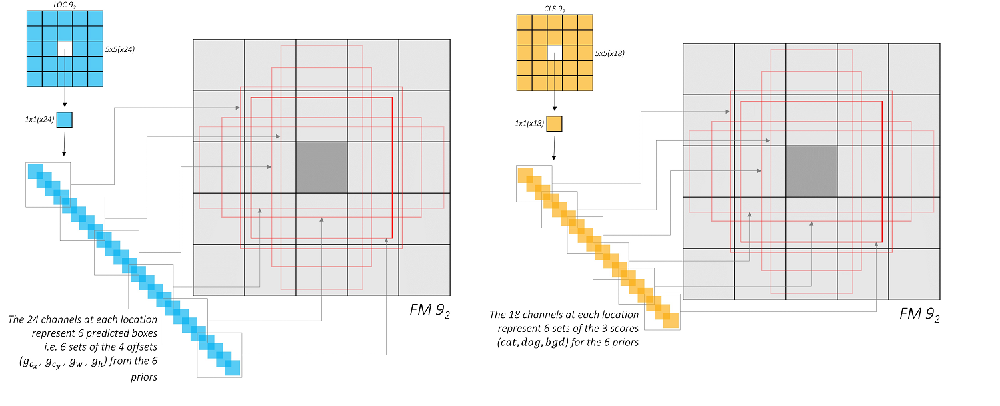

Дальше остается эти представления только reshape (изменить размерности) в нужную форму (которую мы сможем понять и агрегировать для якорей их результаты).

А теперь смотрим код!

In [ ]:
#собираем всё вместе
class SSD300_(nn.Module):
    def __init__(self, n_classes):
        super(SSD300_, self).__init__()
        self.n_classes = n_classes

        #все блоки сверток завели
        self.base = VGGBase()
        self.aux_convs = AuxiliaryConvolutions()
        self.pred_convs = PredictionConvolutions(n_classes)

        # якоря завели
        self.priors_cxcy = self.create_prior_boxes()

        #делаем аккуратный переход с VGG - рескейлим большие признаки с VGG на L2 норму и *rescale_factor (сперва на 20, потом выучится)
        self.rescale_factors = nn.Parameter(torch.FloatTensor(1, 512, 1, 1))  # there are 512 channels in conv4_3_feats
        nn.init.constant_(self.rescale_factors, 20)

    #создаем якори
    def create_prior_boxes(self):
        
        #размерности фичамап которые мы будем использовать
        fmap_dims = {'conv4_3': 38, 'conv7': 19, 'conv8_2': 10,
                     'conv9_2': 5, 'conv10_2': 3, 'conv11_2': 1}

        #scale (относительный) для всех якорей
        obj_scales = {'conv4_3': 0.1, 'conv7': 0.2, 'conv8_2': 0.375,
                      'conv9_2': 0.55, 'conv10_2': 0.725, 'conv11_2': 0.9}
        
        #соотношение сторон, >1 - вертикальные, <1 - горизонтальные
        aspect_ratios = {'conv4_3': [1., 2., 0.5], 'conv7': [1., 2., 3., 0.5, 0.333],
                         'conv8_2': [1., 2., 3., 0.5, 0.333], 'conv9_2': [1., 2., 3., 0.5, 0.333],
                         'conv10_2': [1., 2., 0.5], 'conv11_2': [1., 2., 0.5]}

       
        #для каждой fm, scale, aspect ratio создаем свой якорь 
        prior_boxes = []
        fmaps = list(fmap_dims.keys())

        #выбираем feature map
        for k, fmap in enumerate(fmaps):
            #якори создаем с центром в каждом элементе fm
            for i in range(fmap_dims[fmap]): 
                for j in range(fmap_dims[fmap]): 
                    #задаем относительный центр - середина элемента (i, j)
                    cx = (j + 0.5) / fmap_dims[fmap]
                    cy = (i + 0.5) / fmap_dims[fmap]

                    #теперь для центра надо высчитать cw, ch - по aspect ratio и scale
                    for ratio in aspect_ratios[fmap]:
                        prior_boxes.append([cx, cy, obj_scales[fmap] * sqrt(ratio), obj_scales[fmap] / sqrt(ratio)])

                        #для квадратной формы делаем два якоря - размеров среднего геометрического для этой и следующей feature map
                        if ratio == 1.:
                            try:
                                additional_scale = sqrt(obj_scales[fmap] * obj_scales[fmaps[k + 1]])
                            #для последней карты два одинаковых квадратных якоря
                            except IndexError:
                                additional_scale = 1.
                            prior_boxes.append([cx, cy, additional_scale, additional_scale])

        prior_boxes = torch.FloatTensor(prior_boxes).to(device)  # (8732, 4)
        
        #обрезаем вылезающие края
        prior_boxes.clamp_(0, 1)
        return prior_boxes

    def forward(self, image):
      # первые две карты из VGG
      # (N, 512, 38, 38), (N, 1024, 19, 19)
      conv4_3_feats, conv7_feats = self.base(image)  

      # считаем L2 норму и делаем скейлинг
      norm = conv4_3_feats.pow(2).sum(dim=1, keepdim=True).sqrt()  # (N, 1, 38, 38)
      conv4_3_feats = conv4_3_feats / norm  # (N, 512, 38, 38)
      conv4_3_feats = conv4_3_feats * self.rescale_factors  # (N, 512, 38, 38)

      # последние 4 головы из доп слоев
      # (N, 512, 10, 10),  (N, 256, 5, 5), (N, 256, 3, 3), (N, 256, 1, 1)
      conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats = self.aux_convs(conv7_feats)  

      # получаем значения отступов и скоры всех классов для КАЖДОГО ЯКОРЯ 
      locs, classes_scores = self.pred_convs(conv4_3_feats, conv7_feats, conv8_2_feats, conv9_2_feats, 
                                              conv10_2_feats, conv11_2_feats)  # (N, 8732, 4), (N, 8732, n_classes)

      return locs, classes_scores

Красота. Архитектуру получили. Главный вопрос теперь: 

## **7.2 Как это учить (что за loss)**

В целом как учить сети мы понимаем - сделаем `Dataloader`, будем батчи кормить сетке, она будет нам выдавать для всех своих `8732` якорей значения локализации и скоры классов. 

А что с ними делать? Надо же матчить к разметке? А как учить классификатор? У нас же абсолютное большинство боксов будет класса `background`, сеть может тогда выучиться только к этому классу всё относить, может нам и не нужны якоря, которые с разметкой не пересекаются?

**Алгоритм следующий**:

- считаем `IoU` всех (да, `8732`) якорей с `GT` размерткой на картинке
- матчим с `GT` боксами якоря с наибольшим `IoU` (то есть у каждого объекта есть любимый самый близкий якорь)
- все якори, у которых наибольший `IoU` меньше порога (например, `0.5`), считаются **негативными** примерами (без объекта) - таких будет, конечно, абсолютное большинство, остальные считаем **позитивными** (с надеждой на объект)


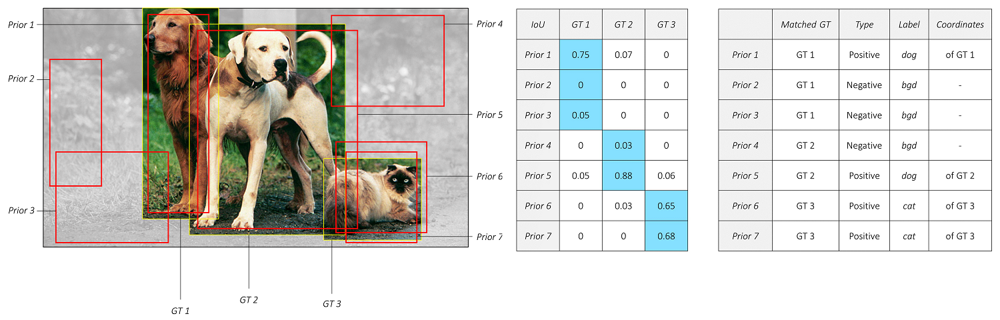

**Localization loss.**

Для всех позитивных якорей мы имеем `gt` разметку (боксы, с которыми они неплохо сматчились), для негативных не имеем таких примеров. Поэтому локализационная часть лосса работает только для `positive` примеров - уточняет их координаты с помощью `Smooth L1` лосса (итоговый лосс - средний по всем `positive` примерам). `That's all`. 

**Confidence loss.**

Классовая же разметка у нас есть для каждого предсказания (якоря) - если он `negative`, то класс `background`. Совсем выкидывать их из обучения нельзя - сеть должна понимать как выглядит фон, но и используя их все, мы значительно перевесим настоящие объекты. Действовать надо аккуратно. 

Решение в целом очевидно - ограничим число негативных примеров, на которых будем обучаться. Надо только выбрать самые лучшие негативные примеры. Как? С помощью **Hard Negative Mining** - выбирая только те примеры, на которых целевой `Cross Entropy Loss` будет наибольшим. В статье предлагается эвристика - брать `negative` примеров в `3` раза больше чем `positive`. 

То есть мы считаем для каждого предсказания `CELoss`, для негативных выбираем топ, позитивные берем все, далее нормируем на число позитивных примеров - и вот он готов. 

Между собой лоссы можно соотносить по важности с помощью гиперпараметра, но в статье он равен 1 и части равнозначны.

**Немножко неприятного про координаты для регрессии.**

Участовать в регрессии будут `gt` разметка (очевидно) и наши текущие `localization` предсказания. Но сделаны и обучены эти предсказания должны быть относительно своего якоря (помним же что в `localization prediction` каждая часть выхода соответствует ЯКОРЮ). Как это делается? 

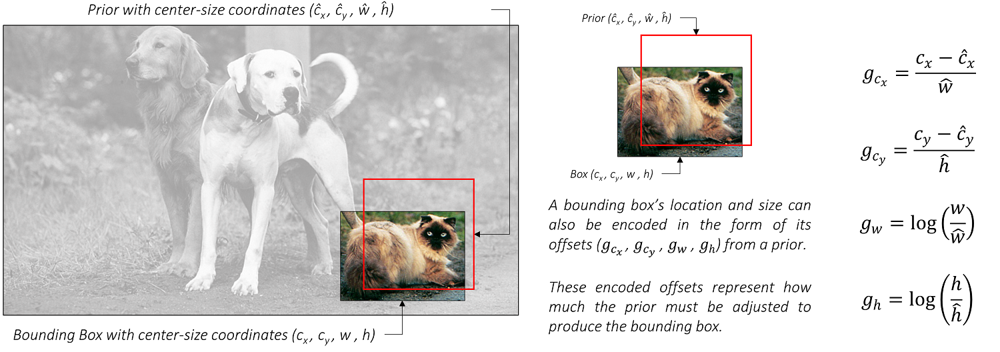

Вот эти 4 отступа `(g_c_x, g_c_y, g_w, g_h)` - как раз то, что мы будем использовать в регрессии. Обратите внимание, что они нормированы по размеру якоря, это логично - один и тот же размер отступа в зависимости от размера якоря будет иметь разную значимость. 

**А теперь код!**

In [ ]:
#Вспомогательные функции
#(x_min, y_min, x_max, y_max) -> (c_x, c_y, w, h)
def xy_to_cxcy(xy):
    return torch.cat([(xy[:, 2:] + xy[:, :2]) / 2,  # c_x, c_y
                      xy[:, 2:] - xy[:, :2]], 1)  # w, h

#(c_x, c_y, w, h) -> (x_min, y_min, x_max, y_max)
def cxcy_to_xy(cxcy):
    return torch.cat([cxcy[:, :2] - (cxcy[:, 2:] / 2),  # x_min, y_min
                      cxcy[:, :2] + (cxcy[:, 2:] / 2)], 1)  # x_max, y_max


#(c_x, c_y, w, h) -> (g_c_x, g_c_y,  g_w, g_h)
#encoding в координаты якоря
def cxcy_to_gcxgcy(cxcy, priors_cxcy):
    return torch.cat([(cxcy[:, :2] - priors_cxcy[:, :2]) / (priors_cxcy[:, 2:] / 10),  # g_c_x, g_c_y
                      torch.log(cxcy[:, 2:] / priors_cxcy[:, 2:]) * 5], 1)  # g_w, g_h


#(g_c_x, g_c_y,  g_w, g_h) -> (c_x, c_y, w, h)
#декодинг из координат якоря в центральные
def gcxgcy_to_cxcy(gcxgcy, priors_cxcy):
    return torch.cat([gcxgcy[:, :2] * priors_cxcy[:, 2:] / 10 + priors_cxcy[:, :2],  # c_x, c_y
                      torch.exp(gcxgcy[:, 2:] / 5) * priors_cxcy[:, 2:]], 1)  # w, h


#считаем intersection для двух групп боксов
def find_intersection(set_1, set_2):
    lower_bounds = torch.max(set_1[:, :2].unsqueeze(1), set_2[:, :2].unsqueeze(0))  # (n1, n2, 2)
    upper_bounds = torch.min(set_1[:, 2:].unsqueeze(1), set_2[:, 2:].unsqueeze(0))  # (n1, n2, 2)
    intersection_dims = torch.clamp(upper_bounds - lower_bounds, min=0)  # (n1, n2, 2)
    return intersection_dims[:, :, 0] * intersection_dims[:, :, 1]  # (n1, n2)


#cчитаем IoU для двух групп боксов
def find_jaccard_overlap(set_1, set_2):
    intersection = find_intersection(set_1, set_2)  # (n1, n2)

    #площади всех боксов
    areas_set_1 = (set_1[:, 2] - set_1[:, 0]) * (set_1[:, 3] - set_1[:, 1])  # (n1)
    areas_set_2 = (set_2[:, 2] - set_2[:, 0]) * (set_2[:, 3] - set_2[:, 1])  # (n2)

    union = areas_set_1.unsqueeze(1) + areas_set_2.unsqueeze(0) - intersection  # (n1, n2)
    return intersection / union  # (n1, n2)

In [ ]:
#составной лосс для обучения детектора
class MultiBoxLoss(nn.Module):

    def __init__(self, priors_cxcy, threshold=0.5, neg_pos_ratio=3, alpha=1.):
        super(MultiBoxLoss, self).__init__()

        self.priors_cxcy = priors_cxcy #якори в относительных координатах
        self.priors_xy = cxcy_to_xy(priors_cxcy) #якори в абсолютных координатах

        self.threshold = threshold #порог на матчинг к GT и отнесение к positive/negative
        self.neg_pos_ratio = neg_pos_ratio #отношение negative/positive числа примеров в расчете лосса
        self.alpha = alpha #гиперпараметр перед локализационной частью

        self.smooth_l1 = nn.L1Loss()
        self.cross_entropy = nn.CrossEntropyLoss(reduce=False)

    def forward(self, predicted_locs, predicted_scores, boxes, labels):
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        n_classes = predicted_scores.size(2)

        assert n_priors == predicted_locs.size(1) == predicted_scores.size(1)

        #делаем заготовки для loсs, scores для якорей
        true_locs = torch.zeros((batch_size, n_priors, 4), dtype=torch.float).to(device)  # (N, 8732, 4)
        true_classes = torch.zeros((batch_size, n_priors), dtype=torch.long).to(device)  # (N, 8732)

        #для каждой картинке в батче
        for i in range(batch_size):
            
            n_objects = boxes[i].size(0) # GT 
            overlap = find_jaccard_overlap(boxes[i], self.priors_xy)  # (n_objects, 8732)

            #для каждого якоря найдем наиболее сматченный GT объект
            #тут получаем значения IoU и индексы
            overlap_for_each_prior, object_for_each_prior = overlap.max(dim=0)  # (8732)

            #Мы должны сматчиться со ВСЕМИ GT объектами на картинке. Какие есть плохие ситуации?
            # 1. Объект ни для одного якоря не оказался лучшим
            # 2. Ни один якорь не пересекся с ним на IoU > threshold
            # Чего делать?

            #для каждого GT объекта находим наиболее сматченный якорь
            # назначим каждому GT объекту наиболее сматченный якорь (решили п.1)
            _, prior_for_each_object = overlap.max(dim=1)  # (N_o)
            object_for_each_prior[prior_for_each_object] = torch.LongTensor(range(n_objects)).to(device)

            #для них искусственно поставим IoU 1 чтобы не отсеять дальше (решили п.2)
            overlap_for_each_prior[prior_for_each_object] = 1.

            # находим классы для каждого якоря (берем у сматченных GT объектов)
            label_for_each_prior = labels[i][object_for_each_prior]  # (8732)
            
            #выкидываем в background (label 0) тех, кто не прошел порог
            label_for_each_prior[overlap_for_each_prior < self.threshold] = 0  # (8732)

            #вытаскиваем финальные предсказания по якорям картинки
            true_classes[i] = label_for_each_prior

            #переводим центральные координаты GT объектов в форму необходимую для регрессии
            true_locs[i] = cxcy_to_gcxgcy(xy_to_cxcy(boxes[i][object_for_each_prior]), self.priors_cxcy)  # (8732, 4)

        #находим positive якоря
        positive_priors = true_classes != 0  # (N, 8732)

        # LOCALIZATION LOSS
        # считаем только для positive якорей 
        loc_loss = self.smooth_l1(predicted_locs[positive_priors], true_locs[positive_priors])  #scalar

        # CONFIDENCE LOSS

        # Confidence loss считается по всем позитивным примерам и самым HARD негативным
        # HARD примеры - те на которых самый большой loss получается
        # считаем число positive и negative примеров
        n_positives = positive_priors.sum(dim=1)  # (N)
        n_hard_negatives = self.neg_pos_ratio * n_positives  # (N)

        # считаем loss для всех якорей (нам же надо будет выбирать)
        conf_loss_all = self.cross_entropy(predicted_scores.view(-1, n_classes), true_classes.view(-1))  # (N * 8732)
        conf_loss_all = conf_loss_all.view(batch_size, n_priors)  # (N, 8732)

        #выбираем те что к positive относятся
        conf_loss_pos = conf_loss_all[positive_priors]  # (sum(n_positives))

        #теперь берем лоссы для hard-negative
        # просто сортируем негативные лоссы и выбираем топ
        conf_loss_neg = conf_loss_all.clone()  # (N, 8732)
        conf_loss_neg[positive_priors] = 0.  # (N, 8732) занулили positive лоссы
        conf_loss_neg, _ = conf_loss_neg.sort(dim=1, descending=True)  # (N, 8732), отсортировали в убывающем порядке

        #завели тензор с ранжированием negative примеров
        hardness_ranks = torch.LongTensor(range(n_priors)).unsqueeze(0).expand_as(conf_loss_neg).to(device)  # (N, 8732)
        #взяли маску самых hard для всех изображений 
        hard_negatives = hardness_ranks < n_hard_negatives.unsqueeze(1)  # (N, 8732)
        #взяли только лоссы hard примеров для всех картинок
        conf_loss_hard_neg = conf_loss_neg[hard_negatives]  # (sum(n_hard_negatives))

        #получили confindense loss и отнормировали на чисто только positive примеров
        conf_loss = (conf_loss_hard_neg.sum() + conf_loss_pos.sum()) / n_positives.sum().float()  # scalar

        return conf_loss + self.alpha * loc_loss #победа

## **7.3 Как вытаскивать предсказания (inference)**

Модель обучена, что дальше? На инференсе она так же будет для каждой картинки выдавать результаты для `8732` якорей. Их надо ещё привести в читаемый формат и отфильтровать по `NMS`.

**План такой**:
- для всех `Localization` поправок `(g_c_x, g_c_y, g_w, g_h)` надо получить из якорей настоящие боксы
- выкинуть всё что относится к `background`
- среди всех `non-bgr` боксов отфильтровать неуверенные детекции по `threshold`
- оставшееся фильтруем по `NMS`
- наслаждаемся результатами (ну или думаем как их улучшить)

**Разбираемся с кодом!**

In [ ]:
class SSD300(SSD300_):
  #добавим функцию для детектирования
  def detect_objects(self, predicted_locs, predicted_scores, min_score, max_overlap, top_k):
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        
        #в архитектуре как всегда нет softmax, добавляем его только на inference 
        #чтобы увидеть вероятности
        predicted_scores = F.softmax(predicted_scores, dim=2)  # (N, 8732, n_classes)

        #копилки для результатов на батч
        all_images_boxes  = list()
        all_images_labels = list()
        all_images_scores = list()

        assert n_priors == predicted_locs.size(1) == predicted_scores.size(1)

        for i in range(batch_size):
            #делаем декодинг в xy 
            decoded_locs = cxcy_to_xy(gcxgcy_to_cxcy(predicted_locs[i], self.priors_cxcy))  # (8732, 4), координаты дробные по отношению к размеру картинки

            #копилки для результатов на картинку
            image_boxes  = list()
            image_labels = list()
            image_scores = list()

            max_scores, best_label = predicted_scores[i].max(dim=1)  # (8732)

            # для каждого класса КРОМЕ bgr
            for c in range(1, self.n_classes):
                # отсеиваем по min_score неуверенные детекции
                class_scores = predicted_scores[i][:, c]  # (8732)
                score_above_min_score = class_scores > min_score 
                n_above_min_score = score_above_min_score.sum().item()
                if n_above_min_score == 0:
                    continue

                #оставляем скоры и локализацию только уверенных детекций    
                class_scores = class_scores[score_above_min_score]  # (n_min_score)
                class_decoded_locs = decoded_locs[score_above_min_score]  # (n_min_score, 4)

                # сортируем списки по score
                class_scores, sort_ind = class_scores.sort(dim=0, descending=True)  # (n_min_score), (n_min_score)
                class_decoded_locs = class_decoded_locs[sort_ind]  # (n_min_score, 4)

                # посчитаем IoU между предсказаниями
                overlap = find_jaccard_overlap(class_decoded_locs, class_decoded_locs)  # (n_qualified, n_min_score)

                # Non-Maximum Suppression (NMS)

                # заводим тензор чтобы следить что выкинем что оставим
                # 1 = suppress, 0 = don't suppress
                suppress = torch.zeros((n_above_min_score), dtype=torch.uint8).to(device)  # (n_qualified)

                # смотрим боксы от самого уверенного по убыванию
                for box in range(class_decoded_locs.size(0)):
                    # если уже решили удалить, continue
                    if suppress[box] == 1:
                        continue

                    #удалим те что сильно сматчились
                    suppress = suppress | (overlap[box] > max_overlap)
                    suppress[box] = 0

                #достанем что осталось
                image_boxes.append(class_decoded_locs[1 - suppress])
                image_labels.append(torch.LongTensor((1 - suppress).sum().item() * [c]).to(device))
                image_scores.append(class_scores[1 - suppress])

            # если ни одного бокса не осталось - всё фон
            if len(image_boxes) == 0:
                image_boxes.append(torch.FloatTensor([[0., 0., 1., 1.]]).to(device))
                image_labels.append(torch.LongTensor([0]).to(device))
                image_scores.append(torch.FloatTensor([0.]).to(device))

            # конкатим по всем объектам
            image_boxes = torch.cat(image_boxes, dim=0)  # (n_objects, 4)
            image_labels = torch.cat(image_labels, dim=0)  # (n_objects)
            image_scores = torch.cat(image_scores, dim=0)  # (n_objects)
            n_objects = image_scores.size(0)

            # можем ограничить общее число объектов на картинке число top_k
            if n_objects > top_k:
                image_scores, sort_ind = image_scores.sort(dim=0, descending=True)
                image_scores = image_scores[:top_k]  # (top_k)
                image_boxes = image_boxes[sort_ind][:top_k]  # (top_k, 4)
                image_labels = image_labels[sort_ind][:top_k]  # (top_k)

            # и добавим в общую копилку
            all_images_boxes.append(image_boxes)
            all_images_labels.append(image_labels)
            all_images_scores.append(image_scores)

        return all_images_boxes, all_images_labels, all_images_scores  # lists of length batch_size

Вот и всё, получили предсказания на целом батче!

## **7.4 Запускаем наш детектор**

In [ ]:
ssd = SSD300(n_classes=21)

In [ ]:
state_dict = ssd.base.state_dict()
param_names = list(state_dict.keys())

In [ ]:
ssd = ssd.to(device)
ssd.eval()

In [ ]:
inp = torch.randn((1, 3, 300, 300))
inp = inp.to(device)

In [ ]:
conv4_3, conv_7 = ssd.base(inp)

In [ ]:
print(conv4_3.shape)
print(conv_7.shape)

In [ ]:
ssd.priors_cxcy.shape

In [ ]:
locs, scrs = ssd(inp)

In [ ]:
scrs.shape

In [ ]:
boxes, labels, scores = ssd.detect_objects(locs.detach(), scrs.detach(), min_score=0.2, max_overlap=0.5, top_k=1)

In [ ]:
scores

**На какие вопросы надо уметь отвечать после семинаров по детекторам?**

1. Какие есть `one-stage`, `two-stage` детекторы? В чем их принципальное отличие?
2. Что такое `NMS`? Зачем и как он используется?
3. Что такое якорь? А `prior`? А как их выбирать? А сколько?
4. Что такое `backbone` детектора? Что лучше брать в качестве `backbone`?
5. Что такое `receptive field`?
6. Сколько голов у `ssd`? Почему так много? На каких головах происходит детектирование маленьких объектов?
7. Как оценивается качество детекции?
8. Из чего состоит `loss` для обучения детектора?
9. Что такое `positive/negative` примеры и как они участвуют в обучении?

**P.S.** Если что-то осталось непонятно, почитайте разбор `SSD` [тут](https://medium.com/@jonathan_hui/ssd-object-detection-single-shot-multibox-detector-for-real-time-processing-9bd8deac0e06).  

А ещё хорошо бы внимательно разобраться с [`YOLO`](https://pjreddie.com/darknet/yolo/) (со всеми версиями) на [`pytorch`](https://github.com/eriklindernoren/PyTorch-YOLOv3), прежде чем будете юзать совсем современные подходы. 

На этом семинары по детектированию заканчиваются, но мир и разнообразие детекторов, конечно, нет. Больше готовых реализаций на `pytorch` вы можете найти в репозитории [`mmdetection`](https://github.com/open-mmlab/mmdetection). Сначала нужно будет повозиться, но зато вы получите доступ сразу к куче детекторов! Плюс, сейчас это один из типичных фреймворков у авторов статей по детекторам - сможете быстро обновляться и добавлять последние методы в свои модели.
